# Goal to predict the operational condition of a waterpump

In [49]:
import pandas as pd
import numpy as np
import plotly.express as px
import math
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import GridSearchCV



## Prep dataframe

In [2]:
dflabels=pd.read_csv('trainingsetlabels.csv')
dflabels_top = dflabels.head() 
#load dataset

In [3]:
colnames=['id','amount_tsh','date_recorded','funder','gps_height','installer','longitude','latitude','wpt_name','num_private','basin','subvillage','region','region_code','district_code','lga','ward','population','public_meeting','recorded_by','scheme_management','scheme_name','permit','construction_year','extraction_type','extraction_type_group','extraction_type_class','management','management_group','payment','payment_type','water_quality','quality_group','quantity','quantity_group','source','source_type','source_class','waterpoint_type','waterpoint_type_group','status_group']
dftraining = pd.read_csv('trainingvalues.csv',sep=',',names=colnames)
dftest = pd.read_csv('testsetvalues.csv',sep=',',names=colnames)
#load dataset

In [4]:
dftraining.drop(dftraining[dftraining['longitude'] < 0.1].index, inplace = True)
dftest.drop(dftest[dftest['longitude'] < 0.1].index, inplace = True)
#drop lines with no spatial information

In [5]:
dftest.isna().sum()

id                          0
amount_tsh                  0
date_recorded               0
funder                    134
gps_height                  0
installer                 135
longitude                   0
latitude                    0
wpt_name                    0
num_private                 0
basin                       0
subvillage                 16
region                      0
region_code                 0
district_code               0
lga                         0
ward                        0
population                  0
public_meeting            102
recorded_by                 0
scheme_management         147
scheme_name              1018
permit                    124
construction_year           0
extraction_type             0
extraction_type_group       0
extraction_type_class       0
management                  0
management_group            0
payment                     1
payment_type                1
water_quality               1
quality_group               1
quantity  

In [6]:
dftraining.isna().sum()

id                           0
amount_tsh                   0
date_recorded                0
funder                    3622
gps_height                   0
installer                 3636
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            2976
recorded_by                  0
scheme_management         3750
scheme_name              26692
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_

In [7]:
dfmerged = dftraining.merge(dflabels, on='id', how='left')
#merge traning and labels dataset 

In [8]:
dfmerged.describe()


,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year,status_group_x
count,57588.00000,57588.000000,57588.000000,57588.000000,57588.000000,57588.000000,57588.000000,57588.000000,57588.000000,57588.000000,0.0
mean,37106.48807,327.645219,689.325137,35.149669,-5.885572,0.489060,15.217615,5.728311,185.570831,1341.577360,NaN
std,21454.51421,3043.831403,693.564188,2.607428,2.809876,12.426954,17.855254,9.760254,477.744239,937.641368,NaN
min,0.00000,0.000000,-90.000000,29.607122,-11.649440,0.000000,1.000000,0.000000,0.000000,0.000000,NaN
25%,18522.75000,0.000000,0.000000,33.285100,-8.643841,0.000000,5.000000,2.000000,0.000000,0.000000,NaN
50%,37054.50000,0.000000,426.000000,35.005943,-5.172704,0.000000,12.000000,3.000000,35.000000,1988.000000,NaN
75%,55667.25000,30.000000,1332.000000,37.233712,-3.372824,0.000000,17.000000,5.000000,230.000000,2004.000000,NaN
max,74247.00000,350000.000000,2770.000000,40.345193,-0.998464,1776.000000,99.000000,80.000000,30500.000000,2013.000000,NaN


In [9]:
dfmerged.duplicated().sum()

0

In [10]:
dftest.describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year,status_group
count,2189.000000,2189.000000,2189.000000,2189.000000,2189.000000,2189.000000,2189.000000,2189.000000,2189.000000,2189.000000,0.0
mean,37422.617634,254.582001,692.447236,35.167696,-5.985222,0.615806,15.355870,5.559616,179.694838,1343.881224,NaN
std,21390.537098,1007.858593,699.897547,2.585342,2.834258,15.053711,18.154927,9.429849,440.914371,937.216552,NaN
min,32.000000,0.000000,-48.000000,29.645932,-11.494605,0.000000,1.000000,1.000000,0.000000,0.000000,NaN
25%,18527.000000,0.000000,0.000000,33.320341,-8.776591,0.000000,5.000000,2.000000,0.000000,0.000000,NaN
50%,38658.000000,0.000000,432.000000,34.996980,-5.543511,0.000000,12.000000,3.000000,35.000000,1989.000000,NaN
75%,55024.000000,30.000000,1336.000000,37.212803,-3.420587,0.000000,17.000000,5.000000,219.000000,2005.000000,NaN
max,74223.000000,20000.000000,2576.000000,40.321315,-0.998752,669.000000,99.000000,63.000000,7200.000000,2013.000000,NaN


In [11]:
dftest.duplicated().sum()

0

In [12]:
dfmerged=dfmerged.drop(dfmerged.columns[[2,3,5,8,9,11,12,13,14,15,16,17,18,19,20,21,22,27,28,29,30,31,40]],axis=1).copy()

In [13]:
dfmerged.shape

(57588, 19)

In [14]:
dftest=dftest.drop(dftest.columns[[2,3,5,8,9,11,12,13,14,15,16,17,18,19,20,21,22,27,28,29,30,31]], axis=1).copy()

In [15]:
dftest.shape

(2189, 19)

In [41]:
dfmerged.round(6)
dftest.round(6)
dfmerged = dfmerged.dropna(subset=['status_group_y']).copy()
#round numbers to six digit after decimal point and drop lines without status in column status_group_y

KeyError: ['status_group_y']

# Data visualization

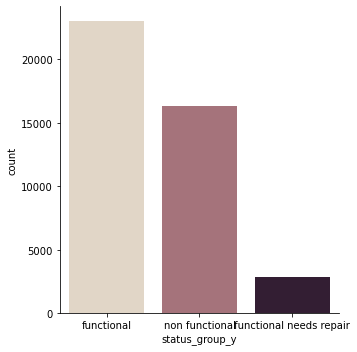

In [17]:
sns.catplot(data=dfmerged, x="status_group_y", kind="count", palette="ch:.25")

In [ ]:
dfmerged

In [46]:
figspatial = px.scatter(dfmerged,x='longitude', y='latitude',size=dfmerged.amount_tsh, width=1000,height=1000)
figspatial.update_layout({'plot_bgcolor': 'rgba(0,12,128,128)'})

In [19]:
figspatial

## Prep data for modeling

In [20]:
dfmerged=pd.get_dummies((dfmerged), drop_first=True).copy()

#data prep for modelling convert categorical value to numerical

In [21]:
dfmerged.shape

(42244, 92)

In [22]:
list(dfmerged.columns)

['id',
 'amount_tsh',
 'gps_height',
 'longitude',
 'latitude',
 'construction_year',
 'basin_Lake Nyasa',
 'basin_Lake Rukwa',
 'basin_Lake Tanganyika',
 'basin_Lake Victoria',
 'basin_Pangani',
 'basin_Rufiji',
 'basin_Ruvuma / Southern Coast',
 'basin_Wami / Ruvu',
 'extraction_type_cemo',
 'extraction_type_climax',
 'extraction_type_gravity',
 'extraction_type_india mark ii',
 'extraction_type_india mark iii',
 'extraction_type_ksb',
 'extraction_type_mono',
 'extraction_type_nira/tanira',
 'extraction_type_other',
 'extraction_type_other - mkulima/shinyanga',
 'extraction_type_other - play pump',
 'extraction_type_other - rope pump',
 'extraction_type_other - swn 81',
 'extraction_type_submersible',
 'extraction_type_swn 80',
 'extraction_type_walimi',
 'extraction_type_windmill',
 'extraction_type_group_gravity',
 'extraction_type_group_india mark ii',
 'extraction_type_group_india mark iii',
 'extraction_type_group_mono',
 'extraction_type_group_nira/tanira',
 'extraction_type_g

In [52]:
#X,y split

X=dfmerged[[
 'amount_tsh',
 'gps_height',
 'longitude',
 'latitude',
 'construction_year',
 'basin_Lake Nyasa',
 'basin_Lake Rukwa',
 'basin_Lake Tanganyika',
 'basin_Lake Victoria',
 'basin_Pangani',
 'basin_Rufiji',
 'basin_Ruvuma / Southern Coast',
 'basin_Wami / Ruvu',
 'extraction_type_cemo',
 'extraction_type_climax',
 'extraction_type_gravity',
 'extraction_type_india mark ii',
 'extraction_type_india mark iii',
 'extraction_type_ksb',
 'extraction_type_mono',
 'extraction_type_nira/tanira',
 'extraction_type_other',
 'extraction_type_other - mkulima/shinyanga',
 'extraction_type_other - play pump',
 'extraction_type_other - rope pump',
 'extraction_type_other - swn 81',
 'extraction_type_submersible',
 'extraction_type_swn 80',
 'extraction_type_walimi',
 'extraction_type_windmill',
 'extraction_type_group_gravity',
 'extraction_type_group_india mark ii',
 'extraction_type_group_india mark iii',
 'extraction_type_group_mono',
 'extraction_type_group_nira/tanira',
 'extraction_type_group_other',
 'extraction_type_group_other handpump',
 'extraction_type_group_other motorpump',
 'extraction_type_group_rope pump',
 'extraction_type_group_submersible',
 'extraction_type_group_swn 80',
 'extraction_type_group_wind-powered',
 'extraction_type_class_handpump',
 'extraction_type_class_motorpump',
 'extraction_type_class_other',
 'extraction_type_class_rope pump',
 'extraction_type_class_submersible',
 'extraction_type_class_wind-powered',
 'quality_group_fluoride',
 'quality_group_good',
 'quality_group_milky',
 'quality_group_salty',
 'quality_group_unknown',
 'quantity_enough',
 'quantity_insufficient',
 'quantity_seasonal',
 'quantity_unknown',
 'quantity_group_enough',
 'quantity_group_insufficient',
 'quantity_group_seasonal',
 'quantity_group_unknown',
 'source_hand dtw',
 'source_lake',
 'source_machine dbh',
 'source_other',
 'source_rainwater harvesting',
 'source_river',
 'source_shallow well',
 'source_spring',
 'source_unknown',
 'source_type_dam',
 'source_type_other',
 'source_type_rainwater harvesting',
 'source_type_river/lake',
 'source_type_shallow well',
 'source_type_spring',
 'source_class_surface',
 'source_class_unknown',
 'waterpoint_type_communal standpipe',
 'waterpoint_type_communal standpipe multiple',
 'waterpoint_type_dam',
 'waterpoint_type_hand pump',
 'waterpoint_type_improved spring',
 'waterpoint_type_other',
 'waterpoint_type_group_communal standpipe',
 'waterpoint_type_group_dam',
 'waterpoint_type_group_hand pump',
 'waterpoint_type_group_improved spring',
 'waterpoint_type_group_other']]  # Features
y=dfmerged['status_group_y_non functional']  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=2, stratify=y) # 70% training and 30% test


## Running the model

In [ ]:
#Hyperparameter tuning

rf = RandomForestClassifier(criterion='gini',
                                n_estimators=500,
                                max_features='auto',
                                oob_score=True,
                                random_state=1,
                                n_jobs=-1)

param_grid = {"min_samples_split" : [4, 6, 8],
             "n_estimators" : [500, 700, 1000]}

gs = GridSearchCV(estimator=rf,
                  param_grid=param_grid,
                  scoring='accuracy',
                  cv=2,
                  n_jobs=-1)

gs = gs.fit(X_train, y_train.values.ravel())

print(gs.best_score_)
print(gs.best_params_)
print(gs.grid_scores_)
